# Проектная работа
# Рынок заведений общественного питания Москвы

# Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

# Описание данных

Файл moscow_places.csv:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:

  «Средний счёт: 1000–1500 ₽»;
  
  «Цена чашки капучино: 130–220 ₽»;
  
  «Цена бокала пива: 400–600 ₽».
  
  и так далее;
  
  
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:

  Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  
  Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  
  Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
  
  
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:

  Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  
  Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  
  Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
  
  
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):

  0 — заведение не является сетевым
  
  1 — заведение является сетевым
  
  
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

# Шаг 1. Загрузка данных и изучение общей информации

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
moscow_places = pd.read_csv('/datasets/moscow_places.csv')
moscow_places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
moscow_places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
moscow_places.shape

(8406, 14)

Сколько заведений представлено? 

8406

Что можно сказать о каждом столбце? Значения какого типа они хранят?

- name, category, address, district содержат 8406 значений и имеют тип object
- lat, lng, rating также содержат 8406 значений и имеют тип float64
- chain содержит 8406 значений и имеет тип int64
- hours -- 7870 значений и тип object 
- price -- 3315 значений и тип object 
- avg_bill -- 3816 значений и тип object 
- middle_avg_bill -- 3149 значений и тип float64
- middle_coffee_cup -- 535 значений и тип float64
- seats -- 4795 значений и тип float64


# Шаг 2. Предобработка данных

In [5]:
# Поиск дубликатов
moscow_places.duplicated().sum()

0

In [6]:
# Поиск пропусков
moscow_places.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Пропуски встречаются в столбцах: 

hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats.

Можно ли их обработать или оставить как есть?

Данные пропуски стоит оставить. Удалить нельзя, так как записи с этими пропусками составляют значительную долю от общего числа записей. Также не всегда возможно вычислить определенные поля, например, поля middle_avg_bill и middle_coffee_cup не получится вычислить, если в поле avg_bill пропуск.

In [7]:
# Создадим столбцы street и is_24/7
moscow_places['street'] = moscow_places['address'].apply(lambda x: x.split(',')[1])
moscow_places['is_24/7'] = moscow_places['hours'] == 'ежедневно, круглосуточно'
moscow_places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


In [8]:
# Поиск неявных дубликатов
moscow_places[['name', 'address']].duplicated().sum()

0

In [9]:
moscow_places['name'].str.lower().duplicated().sum()

2894

Названия могут дублироваться, так как в датасете есть сетевые заведения.

In [10]:
moscow_places['address'].str.lower().duplicated().sum()

2654

Адреса также могут дублироваться, так как, например, по одному и тому же адресу могут находиться разные заведения общественного питания. 

array([[<AxesSubplot:title={'center':'lat'}>,
        <AxesSubplot:title={'center':'lng'}>,
        <AxesSubplot:title={'center':'rating'}>],
       [<AxesSubplot:title={'center':'middle_avg_bill'}>,
        <AxesSubplot:title={'center':'middle_coffee_cup'}>,
        <AxesSubplot:title={'center':'chain'}>],
       [<AxesSubplot:title={'center':'seats'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

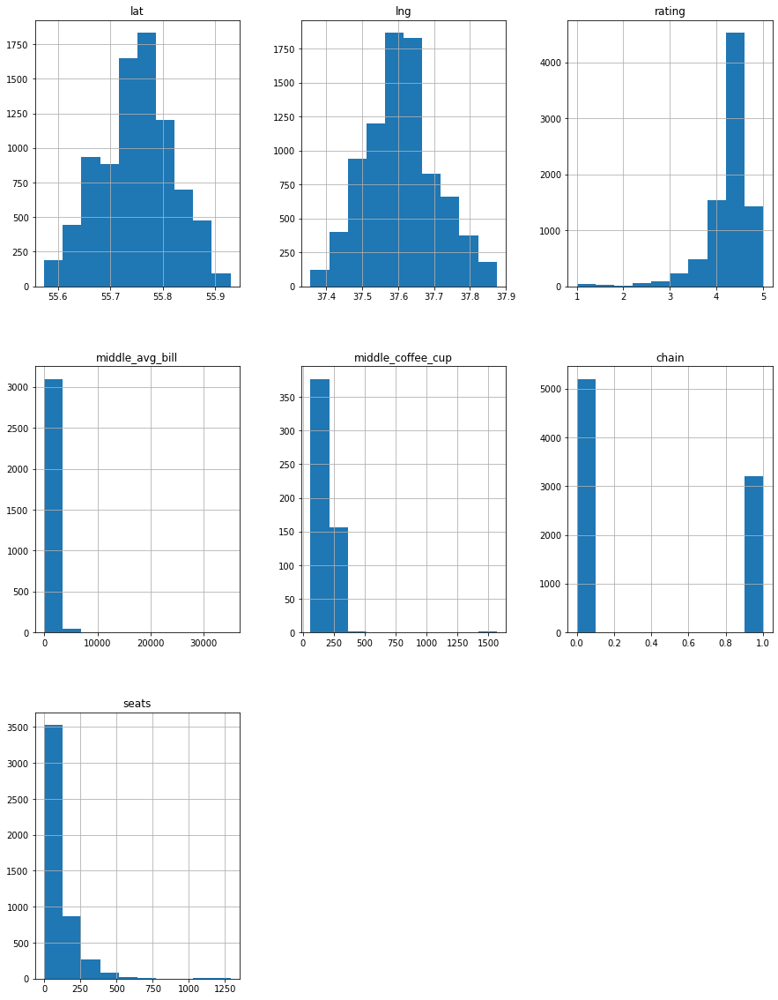

In [11]:
# Рассмотрим распределение числовых показателей
moscow_places.hist(figsize=(15, 20))

Есть аномалии в полях middle_coffee_cup и seats, но их количество незначительно, поэтому можно не обрабатывать.

# Шаг 3. Анализ данных

,index,category,count
0,1,булочная,256
1,7,столовая,315
2,2,быстрое питание,603
3,5,пиццерия,633
4,0,"бар,паб",765
5,4,кофейня,1413
6,6,ресторан,2043
7,3,кафе,2378


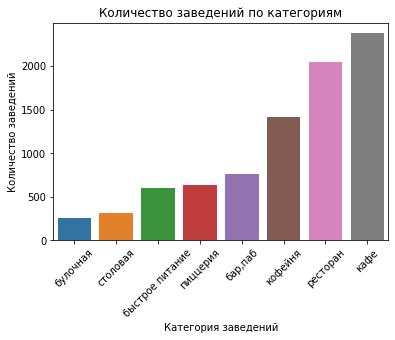

In [12]:
# Исследование количества объектов общественного питания по категориям
places_count = moscow_places.groupby(by='category', as_index=False).agg({'name':'count'})\
.rename(columns={'name': 'count'}).sort_values(by='count').reset_index()
display(places_count)

sns.barplot(x='category', y='count', data=places_count)

plt.title('Количество заведений по категориям')
plt.xlabel('Категория заведений')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45)

plt.show()

Какие категории заведений представлены в данных?

булочная

столовая 

быстрое питание 

пиццерия 

бар,паб

кофейня

ресторан

кафе


Меньше всего булочных. Кафе -- самая распространенная категория заведений.

,index,category,seats
0,1,булочная,89.0
1,5,пиццерия,94.0
2,3,кафе,98.0
3,2,быстрое питание,99.0
4,7,столовая,100.0
5,4,кофейня,111.0
6,6,ресторан,122.0
7,0,"бар,паб",125.0


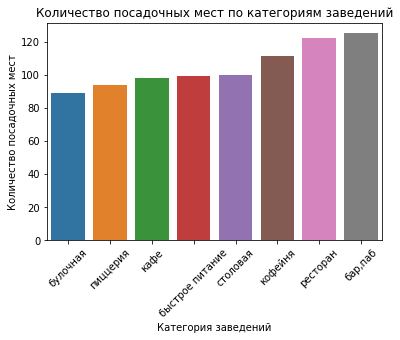

In [13]:
# Исследование количества посадочных мест в заведениях общественного питания по категориям
seats_count = moscow_places.groupby(by='category', as_index=False).agg({'seats': 'mean'})\
.round().sort_values(by='seats').reset_index()
display(seats_count)

sns.barplot(x='category', y='seats', data=seats_count)

plt.title('Количество посадочных мест по категориям заведений')
plt.xlabel('Категория заведений')
plt.ylabel('Количество посадочных мест')
plt.xticks(rotation=45)

plt.show()

Выводы:
- меньше всего посадочных мест в булочных(89) и пиццериях(94)
- больше всего посадочных мест в ресторанах(122) и барах и пабах(125) 

,chain,count
0,0,5201
1,1,3205


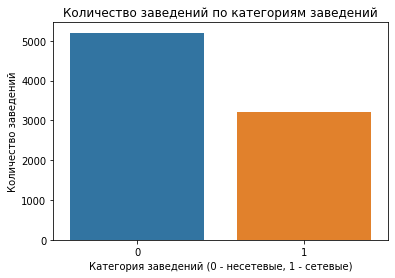

In [14]:
# Исследование соотношения сетевых и несетевых заведений в датасете
places_chain = moscow_places.groupby(by='chain', as_index=False).agg({'name': 'count'}).\
rename(columns={'name': 'count'})
display(places_chain)

sns.barplot(x='chain', y='count', data=places_chain)

plt.title('Количество заведений по категориям заведений')
plt.xlabel('Категория заведений (0 - несетевые, 1 - сетевые)')
plt.ylabel('Количество заведений')

plt.show()

Каких заведений больше?

- Несетевых заведений больше, чем сетевых(5201 против 3205)

,index,category,chain,count
0,6,кафе,0,1599
1,12,ресторан,0,1313
2,7,кафе,1,779
3,13,ресторан,1,730
4,9,кофейня,1,720
5,8,кофейня,0,693
6,0,"бар,паб",0,596
7,4,быстрое питание,0,371
8,11,пиццерия,1,330
9,10,пиццерия,0,303


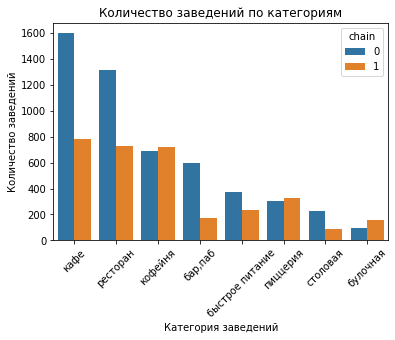

In [15]:
# Исследование категорий заведений, которые являются сетевыми 
category_chain = moscow_places.groupby(by=['category', 'chain'], as_index=False).agg({'name': 'count'}).\
rename(columns={'name': 'count'}).sort_values(by='count', ascending=False).reset_index()
display(category_chain)

sns.barplot(x='category', y='count', hue='chain', data=category_chain)

plt.title('Количество заведений по категориям')
plt.xlabel('Категория заведений')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45)

plt.show()

In [16]:
# Посчитаем доли сетевых заведений от общего числа заведений по категориям
shares = moscow_places.query('chain == 1').groupby('category')\
.agg({'name': 'count'})['name']/moscow_places.groupby('category').agg({'name': 'count'})['name']
shares.sort_values(ascending=False)

category
булочная           0.613281
пиццерия           0.521327
кофейня            0.509554
быстрое питание    0.384743
ресторан           0.357318
кафе               0.327586
столовая           0.279365
бар,паб            0.220915
Name: name, dtype: float64

Какие категории заведений чаще являются сетевыми? 

Сетевыми чаще всего являются такие категории заведений, как "кофейня", "пиццерия" и "булочная".

,name,category,count
1142,Шоколадница,кофейня,119
504,Домино'с Пицца,пиццерия,76
497,Додо Пицца,пиццерия,74
206,One Price Coffee,кофейня,71
1158,Яндекс Лавка,ресторан,69
73,Cofix,кофейня,65
242,Prime,ресторан,49
558,КОФЕПОРТ,кофейня,42
644,Кулинарная лавка братьев Караваевых,кафе,39
978,Теремок,ресторан,36


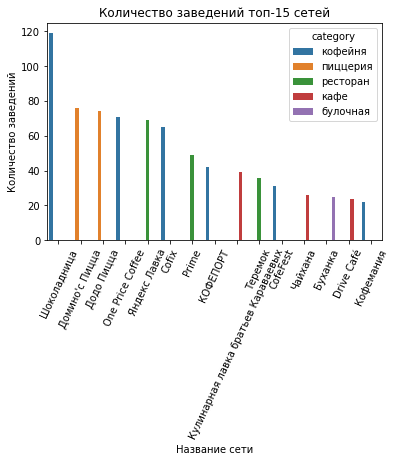

In [17]:
# Вычисляем топ-15 популярных сетей в Москве
top = moscow_places[moscow_places['chain'] == 1].groupby(by=['name', 'category'], as_index=False)\
.agg({'address': 'count'}).rename(columns={'address': 'count'})\
.sort_values(by='count', ascending=False).head(15)
display(top)

# Строим визуализацию
sns.barplot(x='name', y='count', hue='category', data=top)

plt.title('Количество заведений топ-15 сетей')
plt.xlabel('Название сети')
plt.ylabel('Количество заведений')
plt.xticks(rotation=65)

plt.show()

Знакомы ли вам эти сети? 

Данные сети мне не знакомы.

Есть ли какой-то признак, который их объединяет? 

Возможно, объединяющим признаком является то, что все эти заведения предназначены для быстрого питания. И хорошо подходят, когда нужно быстро и дешево перекусить.

К какой категории заведений они относятся?

В основном они относятся к следующим категориям: "кофейня", "пиццерия", "кафе", "булочная".

In [18]:
# Какие административные районы Москвы присутствуют в датасете?
moscow_places['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [19]:
# Вычисляем количество заведений каждой категории по районам
district_category = moscow_places\
.pivot_table(index='category', columns='district', values='name', aggfunc='count')
district_category

district,Восточный административный округ,Западный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Западный административный округ,Центральный административный округ,Юго-Восточный административный округ,Юго-Западный административный округ,Южный административный округ
category,,,,,,,,,
"бар,паб",53,50,68,63,23,364,38,38,68
булочная,25,37,39,28,12,50,13,27,25
быстрое питание,71,62,58,82,30,87,67,61,85
кафе,272,239,235,269,115,464,282,238,264
кофейня,105,150,193,159,62,428,89,96,131
пиццерия,72,71,77,68,40,113,55,64,73
ресторан,160,218,189,182,109,670,145,168,202
столовая,40,24,41,40,18,66,25,17,44


In [20]:
# Вычисляем общее количество заведений по районам и сортируем по убыванию
sorted_district = district_category.sum().sort_values(ascending=False)
sorted_district

district
Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
dtype: int64

In [21]:
# Получаем отсортированные(по общему количеству заведений) индексы
sorted_district.index

Index(['Центральный административный округ', 'Северный административный округ',
       'Южный административный округ',
       'Северо-Восточный административный округ',
       'Западный административный округ', 'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Юго-Западный административный округ',
       'Северо-Западный административный округ'],
      dtype='object', name='district')

In [22]:
# Используем отсортированные индексы для сортировки датафрейма
district_category = district_category[sorted_district.index]
district_category

district,Центральный административный округ,Северный административный округ,Южный административный округ,Северо-Восточный административный округ,Западный административный округ,Восточный административный округ,Юго-Восточный административный округ,Юго-Западный административный округ,Северо-Западный административный округ
category,,,,,,,,,
"бар,паб",364,68,68,63,50,53,38,38,23
булочная,50,39,25,28,37,25,13,27,12
быстрое питание,87,58,85,82,62,71,67,61,30
кафе,464,235,264,269,239,272,282,238,115
кофейня,428,193,131,159,150,105,89,96,62
пиццерия,113,77,73,68,71,72,55,64,40
ресторан,670,189,202,182,218,160,145,168,109
столовая,66,41,44,40,24,40,25,17,18


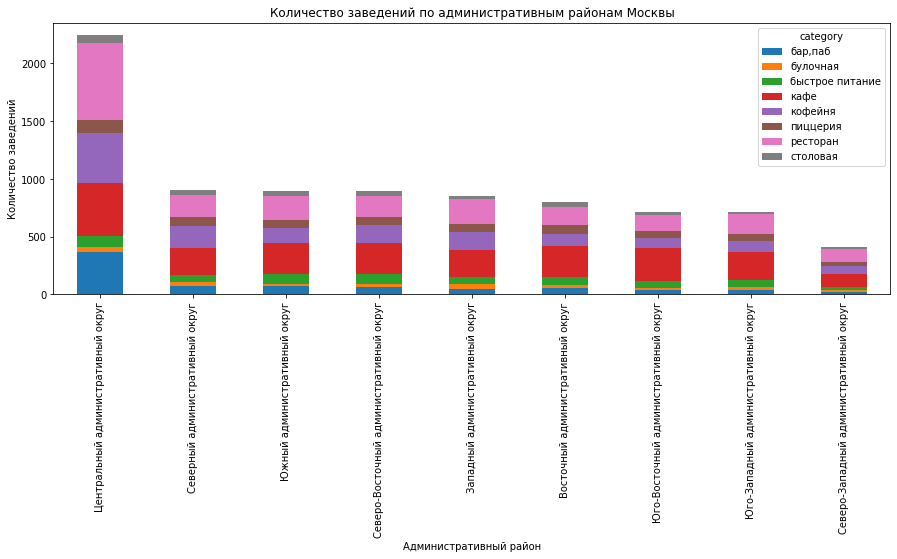

In [23]:
# Отображаем общее количество заведений и 
# количество заведений каждой категории по районам одним графиком
district_category.T.plot(kind='bar', stacked=True, figsize=(15, 5))

plt.title('Количество заведений по административным районам Москвы')
plt.xlabel('Административный район')
plt.ylabel('Количество заведений')

plt.show()

,index,category,rating
0,2,быстрое питание,4.05
1,3,кафе,4.12
2,7,столовая,4.21
3,1,булочная,4.27
4,4,кофейня,4.28
5,6,ресторан,4.29
6,5,пиццерия,4.30
7,0,"бар,паб",4.39


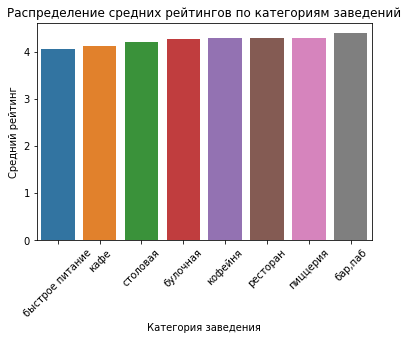

In [24]:
# Исследование распределения средних рейтингов по категориям заведений
category_rating = moscow_places.groupby(by='category', as_index=False)\
.agg({'rating': 'mean'}).sort_values(by='rating').reset_index().round(2)
display(category_rating)

sns.barplot(x='category', y='rating', data=category_rating)

plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Средний рейтинг')
plt.xticks(rotation=45)

plt.show()

Сильно ли различаются усреднённые рейтинги в разных типах общепита?

Нет, сильных различий не видно. Усреднённые рейтинги находятся в пределах 4,05 - 4,39

In [25]:
# Построим фоновую картограмму(хороплет) со средним рейтингом заведений каждого района

# Вычисляем средний рейтинг заведений каждого района
rating_district = moscow_places.groupby('district', as_index=False)\
.agg({'rating': 'mean'}).round(2)
display(rating_district)

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [26]:
# Отобразим все заведения датасета на карте с помощью 
# кластеров средствами библиотеки folium

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
moscow_places.apply(create_clusters, axis=1)

# выводим карту
m

In [27]:
# Вычисляем топ-15 улиц по количеству заведений
top_street = moscow_places.groupby('street').agg({'name': 'count'})\
.rename(columns={'name': 'count'}).sort_values(by='count', ascending=False).head(15)
top_street

,count
street,
проспект Мира,184
Профсоюзная улица,122
проспект Вернадского,108
Ленинский проспект,107
Ленинградский проспект,95
Дмитровское шоссе,88
Каширское шоссе,77
Варшавское шоссе,76
Ленинградское шоссе,70


street,проспект Мира,Профсоюзная улица,проспект Вернадского,Ленинский проспект,Ленинградский проспект,Дмитровское шоссе,Каширское шоссе,Варшавское шоссе,Ленинградское шоссе,МКАД,Люблинская улица,улица Вавилова,Кутузовский проспект,улица Миклухо-Маклая,Пятницкая улица
category,,,,,,,,,,,,,,,
"бар,паб",12.0,6.0,7.0,10.0,15.0,6.0,2.0,6.0,5.0,1.0,5.0,2.0,2.0,3.0,9.0
булочная,4.0,4.0,1.0,3.0,4.0,2.0,NaN,NaN,2.0,NaN,NaN,2.0,1.0,NaN,3.0
быстрое питание,21.0,15.0,12.0,2.0,2.0,10.0,10.0,7.0,5.0,9.0,5.0,11.0,2.0,4.0,2.0
кафе,53.0,35.0,25.0,26.0,12.0,23.0,20.0,18.0,13.0,45.0,26.0,15.0,14.0,21.0,7.0
кофейня,36.0,18.0,16.0,23.0,25.0,11.0,16.0,14.0,13.0,4.0,11.0,10.0,13.0,4.0,6.0
пиццерия,11.0,15.0,12.0,5.0,9.0,8.0,5.0,4.0,3.0,NaN,1.0,3.0,3.0,2.0,3.0
ресторан,45.0,26.0,33.0,33.0,25.0,24.0,19.0,20.0,26.0,5.0,10.0,12.0,16.0,15.0,18.0
столовая,2.0,3.0,2.0,5.0,3.0,4.0,5.0,7.0,3.0,1.0,2.0,NaN,3.0,NaN,NaN


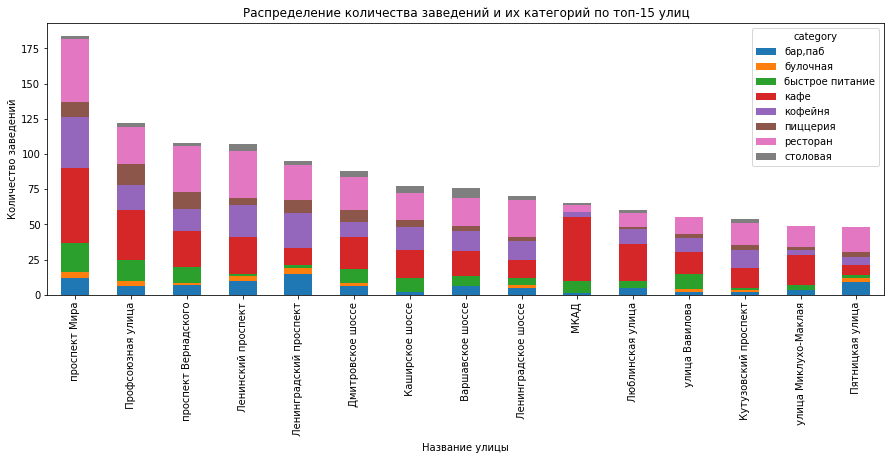

In [28]:
# Построим график распределения количества заведений и их категорий по топ-15 улиц

top_street_category = moscow_places.pivot_table(index='category', columns='street', values='name', aggfunc='count')
top_street_category = top_street_category[top_street.index]
display(top_street_category)

top_street_category.T.plot(kind='bar', stacked=True, figsize=(15, 5))

plt.title('Распределение количества заведений и их категорий по топ-15 улиц')
plt.xlabel('Название улицы')
plt.ylabel('Количество заведений')

plt.show()

In [29]:
# Находим улицы, на которых находится только один объект общепита
streets_one_place = moscow_places.groupby('street', as_index=False).agg({'name': 'count'})\
.rename(columns={'name': 'count'}).query('count == 1')['street']
streets_one_place

0         1-й Автозаводский проезд
1          1-й Балтийский переулок
2            1-й Варшавский проезд
3          1-й Вешняковский проезд
5        1-й Голутвинский переулок
                   ...            
1436                 улица Шкулёва
1437               улица Шкулёва 4
1439                  улица Шухова
1442                 улица Юннатов
1447                           № 7
Name: street, Length: 458, dtype: object

In [30]:
one_place = moscow_places[moscow_places['street'].isin(streets_one_place)]

<AxesSubplot:xlabel='district', ylabel='count'>

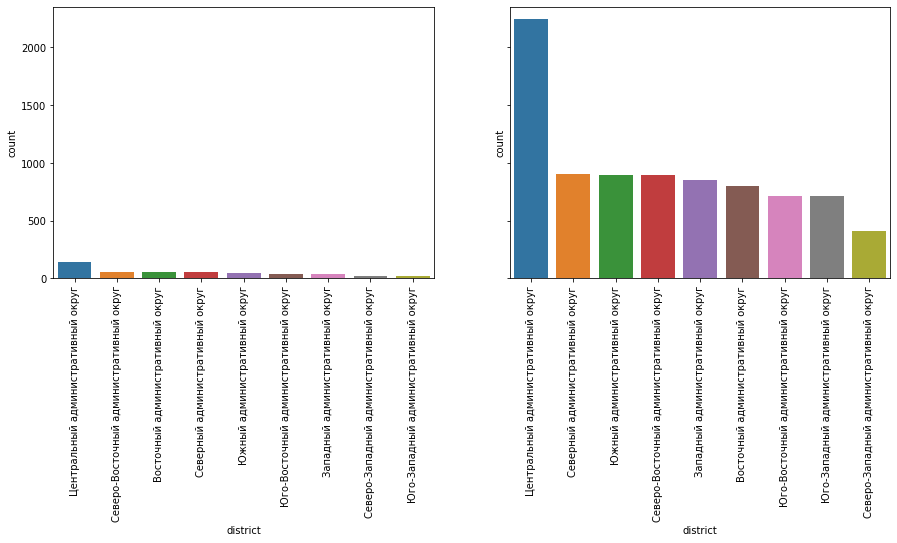

In [31]:
# Сравним распределение по районам количества заведений 
# датасета с улицами, на которых находится только один объект общепита,
# и датасета со всеми данными

fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharey=True)

one_place_distict = one_place.groupby(by=['district'], as_index=False)\
.agg({'name': 'count'}).rename(columns={'name': 'count'}).sort_values(by='count', ascending=False)

moscow_places_district = moscow_places.groupby(by=['district'], as_index=False)\
.agg({'name': 'count'}).rename(columns={'name': 'count'}).sort_values(by='count', ascending=False)

axes[0].tick_params(axis='x', labelrotation=90)
axes[1].tick_params(axis='x', labelrotation=90)

sns.barplot(data=one_place_distict, x='district', y='count', ax=axes[0])
sns.barplot(data=moscow_places_district, x='district', y='count', ax=axes[1])

Проведенное сравнение двух датасетов показывает, что распределение количества заведений по районам разное, за исключением ЦАО, который лидирует по количеству заведений. Но в целом значения других районов примерно одинаковые.

<AxesSubplot:xlabel='category', ylabel='count'>

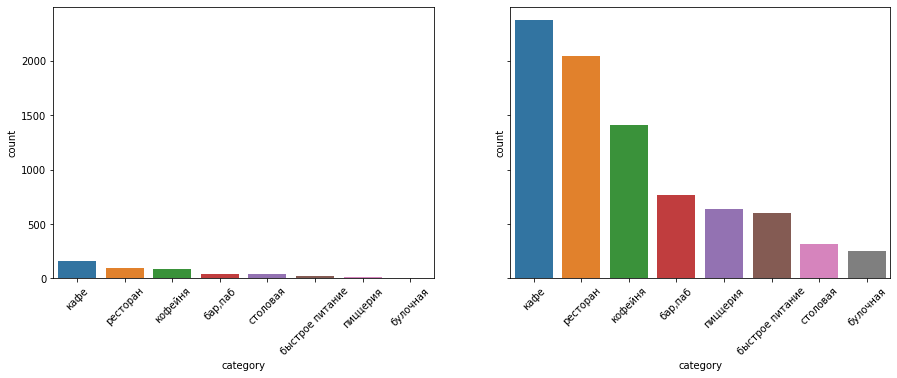

In [32]:
# Сравним распределение по категориям количества заведений 
# датасета с улицами, на которых находится только один объект общепита,
# и датасета со всеми данными

fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharey=True)

one_place_distict = one_place.groupby(by=['category'], as_index=False)\
.agg({'name': 'count'}).rename(columns={'name': 'count'}).sort_values(by='count', ascending=False)

moscow_places_district = moscow_places.groupby(by=['category'], as_index=False)\
.agg({'name': 'count'}).rename(columns={'name': 'count'}).sort_values(by='count', ascending=False)

axes[0].tick_params(axis='x', labelrotation=45)
axes[1].tick_params(axis='x', labelrotation=45)

sns.barplot(data=one_place_distict, x='category', y='count', ax=axes[0])
sns.barplot(data=moscow_places_district, x='category', y='count', ax=axes[1])

Проведенное сравнение двух датасетов показывает, что распределение количества заведений по категориям почти одинаковое. Лишь категории "столовая" и "пиццерия" поменялись местами: для одиночных заведений "столовых" больше, чем "пиццерий".

<AxesSubplot:xlabel='district', ylabel='middle_avg_bill'>

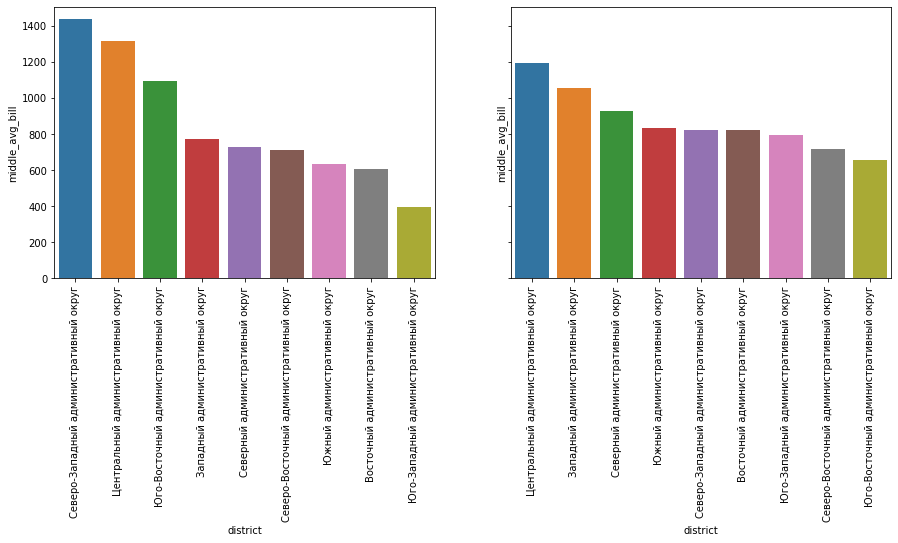

In [33]:
# Сравним распределение по районам среднего чека 
# датасета с улицами, на которых находится только один объект общепита,
# и датасета со всеми данными

fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharey=True)

one_place_distict = one_place.groupby(by=['district'], as_index=False)\
.agg({'middle_avg_bill': 'mean'}).sort_values(by='middle_avg_bill', ascending=False)

moscow_places_district = moscow_places.groupby(by=['district'], as_index=False)\
.agg({'middle_avg_bill': 'mean'}).sort_values(by='middle_avg_bill', ascending=False)

axes[0].tick_params(axis='x', labelrotation=90)
axes[1].tick_params(axis='x', labelrotation=90)

sns.barplot(data=one_place_distict, x='district', y='middle_avg_bill', ax=axes[0])
sns.barplot(data=moscow_places_district, x='district', y='middle_avg_bill', ax=axes[1])

Распределение по районам среднего чека для одиночных заведений полностью отличается от аналогичного распределения для всего датасета: лидер по среднему чеку -- СЗАО, последний -- ЮЗАО. 

<AxesSubplot:xlabel='category', ylabel='middle_avg_bill'>

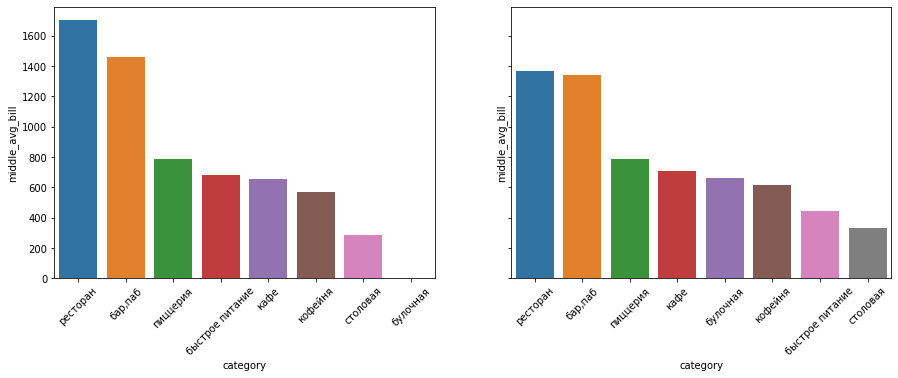

In [34]:
# Сравним распределение по категориям среднего чека 
# датасета с улицами, на которых находится только один объект общепита,
# и датасета со всеми данными

fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharey=True)

one_place_distict = one_place.groupby(by=['category'], as_index=False)\
.agg({'middle_avg_bill': 'mean'}).sort_values(by='middle_avg_bill', ascending=False)

moscow_places_district = moscow_places.groupby(by=['category'], as_index=False)\
.agg({'middle_avg_bill': 'mean'}).sort_values(by='middle_avg_bill', ascending=False)

axes[0].tick_params(axis='x', labelrotation=45)
axes[1].tick_params(axis='x', labelrotation=45)

sns.barplot(data=one_place_distict, x='category', y='middle_avg_bill', ax=axes[0])
sns.barplot(data=moscow_places_district, x='category', y='middle_avg_bill', ax=axes[1])

Распределение по категориям среднего чека для одиночных заведений наполовину отличается от аналогичного распределения для всего датасета, но лидеры и аутсайдер совпадают для обоих распределений. Лидеры по среднему чеку -- "ресторан" и "бар, паб", аутсайдер -- "столовая"; значения для других категорий не имеют сильных различий в сравнении двух распределений.

In [35]:
one_place['category'].unique()

array(['столовая', 'кафе', 'кофейня', 'ресторан', 'бар,паб',
       'быстрое питание', 'пиццерия', 'булочная'], dtype=object)

In [36]:
one_place['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Западный административный округ',
       'Юго-Восточный административный округ',
       'Юго-Западный административный округ',
       'Южный административный округ'], dtype=object)

In [37]:
one_place['chain'].unique()

array([0, 1])

Что можно сказать об этих заведениях?

Доля этих заведений от общего числа заведений составляет 5,45%(458/8406 * 100). Данные заведения представлены во всех районах, во всех категориях и являются сетевыми и несетевыми. Возможно, этим заведениям не могут составить конкуренцию другие заведения на представленных выше улицах(458 улиц). Распределение по районам среднего чека для одиночных заведений полностью отличается от аналогичного распределения для всего датасета: лидер по среднему чеку -- СЗАО, последний -- ЮЗАО. 

In [38]:
# Посчитаем медиану middle_avg_bill для каждого района
district_bill = moscow_places.groupby('district', as_index=False)\
.agg({'middle_avg_bill': 'median'})
district_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [39]:
# Построим фоновую картограмму(хороплет) с полученными значениями 
# медианы middle_avg_bill для каждого района

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медиана числа с оценкой среднего чека заведений по районам',
).add_to(m)

# выводим карту
m

district,Восточный административный округ,Западный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Западный административный округ,Центральный административный округ,Юго-Восточный административный округ,Юго-Западный административный округ,Южный административный округ
price,,,,,,,,,
высокие,27,51,50,18,14,271,8,21,18
выше среднего,30,68,47,41,21,240,23,41,53
низкие,18,11,18,21,3,34,15,15,21
средние,169,177,228,229,108,666,153,168,219


district
Центральный административный округ         1211
Северный административный округ             343
Южный административный округ                311
Северо-Восточный административный округ     309
Западный административный округ             307
Юго-Западный административный округ         245
Восточный административный округ            244
Юго-Восточный административный округ        199
Северо-Западный административный округ      146
dtype: int64

district,Центральный административный округ,Северный административный округ,Южный административный округ,Северо-Восточный административный округ,Западный административный округ,Юго-Западный административный округ,Восточный административный округ,Юго-Восточный административный округ,Северо-Западный административный округ
price,,,,,,,,,
высокие,271,50,18,18,51,21,27,8,14
выше среднего,240,47,53,41,68,41,30,23,21
низкие,34,18,21,21,11,15,18,15,3
средние,666,228,219,229,177,168,169,153,108


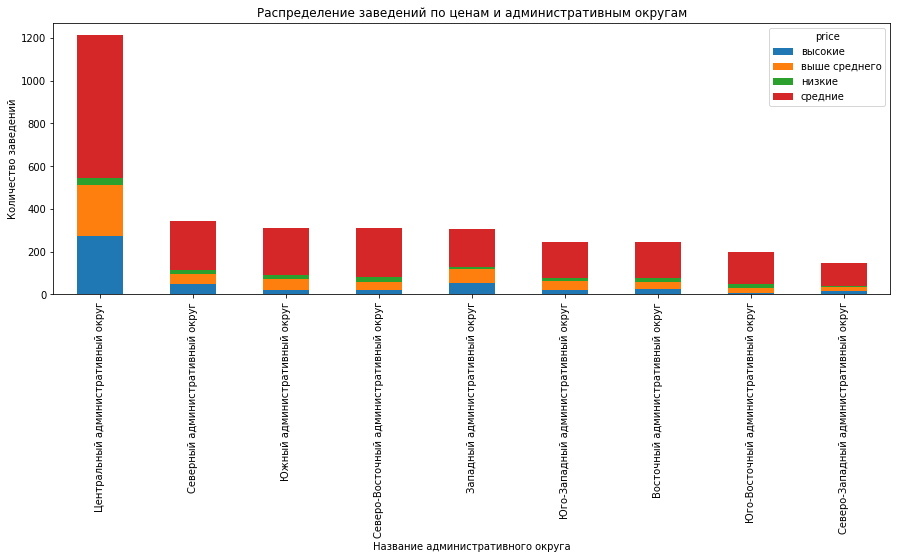

In [40]:
# Проанализируем цены в центральном административном округе и других

district_price = moscow_places\
.pivot_table(index='price', columns='district', values='name', aggfunc='count')
display(district_price)

district_price_sum = district_price.sum().sort_values(ascending=False)
display(district_price_sum)

district_price = district_price[district_price_sum.index]
display(district_price)

district_price.T.plot(kind='bar', stacked=True, figsize=(15, 5))

plt.title('Распределение заведений по ценам и административным округам')
plt.xlabel('Название административного округа')
plt.ylabel('Количество заведений')

plt.show()

Как удалённость от центра влияет на цены в заведениях?

График показывает:
- в сравнении с центральным административным округом цены в других округах представлены в меньшем количестве и имеют меньшие доли; вероятно, это связано с тем, что в ЦАО больше заведений общественного питания(2242) и большая проходимость
- по всем административным округам наблюдается преобладние "средних" цен, а наименьшее количество цен -- "низких", за исключением ЮВАО, в котором наименьшее количество "высоких" цен

Общий вывод:
- В Москве больше всего "кафе", меньше всего "булочных".
- Меньше всего посадочных мест в булочных(89) и пиццериях(94), больше всего посадочных мест в ресторанах(122) и барах и пабах(125).
- Несетевых заведений больше в 1,62 раза, чем сетевых(5201 против 3205).
- Сетевыми чаще всего являются такие категории заведений, как "кофейня", "пиццерия" и "булочная".
- Среди топ-15 популярных сетей представлены категории "кофейня", "пиццерия", "кафе", "булочная". Возможно, это связано с тем, что у людей пользуются популярностью заведения, в которых можно быстро и дешево утолить голод.
- "Булочные" и "столовые" -- наименее распространенные категории по районам, "кафе" — наиболее распространенная категория, за искл. ЦАО, в котором "рестораны" являются преобладающей категорией.
- Усреднённые рейтинги в разных типах общепита находятся в пределах 4,05 — 4,39.
- Средний рейтинг заведений по районам: 4,10-4,38.
- Чем ближе к центру города, тем больше общее количество заведений общепита.
- Топ-15 улиц по количеству заведений: проспект Мира, Профсоюзная улица, проспект Вернадского, Ленинский проспект, Ленинградский проспект, Дмитровское шоссе, Каширское шоссе, Варшавское шоссе, Ленинградское шоссе, МКАД, Люблинская улица, улица Вавилова, Кутузовский проспект, улица Миклухо-Маклая, Пятницкая улица. Преобладающие категории заведений на этих улицах — "кафе" и "рестораны", наименьшее количество заведений наблюдается в категориях "булочные", "столовые".
- Количество улиц, на которых находится только один объект общепита, составляет 458. Доля этих заведений от общего числа заведений составляет 5,45%(458/8406 * 100). Данные заведения представлены во всех районах, во всех категориях и являются сетевыми и несетевыми. Возможно, этим заведениям не могут составить конкуренцию другие заведения.Распределение по районам среднего чека для одиночных заведений полностью отличается от аналогичного распределения для всего датасета: лидер по среднему чеку -- СЗАО, последний -- ЮЗАО.
- По оценке среднего чека лидируют ЦАО и ЗАО, в аутсайдерах — ЮВАО, СВАО и ЮАО.
- Цены в заведениях: в сравнении с центральным административным округом цены в других округах представлены в меньшем количестве и имеют меньшие доли; вероятно, это связано с тем, что в ЦАО больше заведений общественного питания(2242) и большая проходимость; по всем административным округам наблюдается преобладние "средних" цен, а наименьшее количество цен -- "низких", за исключением ЮВАО, в котором наименьшее количество "высоких" цен.

# Шаг 4. Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

In [41]:
# Сколько всего кофеен в датасете?
coffee_houses = moscow_places.query('category == "кофейня"')
coffee_houses['name'].count()

1413

In [42]:
# В каких районах их больше всего, каковы особенности их расположения?
coffee_houses_count = coffee_houses.groupby('district', as_index=False)\
.agg({'name': 'count'}).rename(columns={'name': 'count'})\
.sort_values(by='count', ascending=False).reset_index()
coffee_houses_count

,index,district,count
0,5,Центральный административный округ,428
1,2,Северный административный округ,193
2,3,Северо-Восточный административный округ,159
3,1,Западный административный округ,150
4,8,Южный административный округ,131
5,0,Восточный административный округ,105
6,7,Юго-Западный административный округ,96
7,6,Юго-Восточный административный округ,89
8,4,Северо-Западный административный округ,62


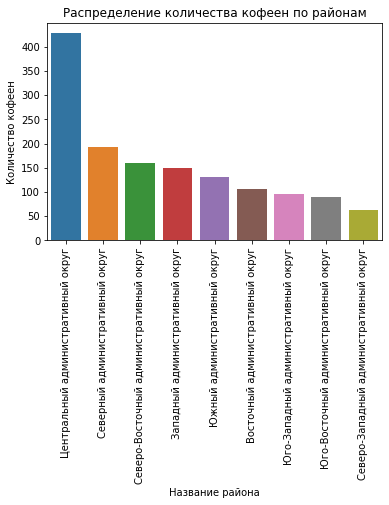

In [43]:
sns.barplot(x='district', y='count', data=coffee_houses_count)

plt.title('Распределение количества кофеен по районам')
plt.xlabel('Название района')
plt.ylabel('Количество кофеен')
plt.xticks(rotation=90)

plt.show()

In [44]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_houses_count,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен по районам',
).add_to(m)

# выводим карту
m

Больше всего кофеен в центральном и северном административных округах.

In [45]:
coffee_houses[coffee_houses['is_24/7'] == True]['name'].count()

59

Да, есть. Таких кофеен 59.

In [46]:
# Какие у кофеен рейтинги? Как они распределяются по районам?
coffee_houses_rating = coffee_houses.groupby('district', as_index=False)\
.agg({'rating': 'mean'}).round(2).sort_values(by='rating', ascending=False).reset_index()
coffee_houses_rating

,index,district,rating
0,5,Центральный административный округ,4.34
1,4,Северо-Западный административный округ,4.33
2,2,Северный административный округ,4.29
3,0,Восточный административный округ,4.28
4,7,Юго-Западный административный округ,4.28
5,6,Юго-Восточный административный округ,4.23
6,8,Южный административный округ,4.23
7,3,Северо-Восточный административный округ,4.22
8,1,Западный административный округ,4.20


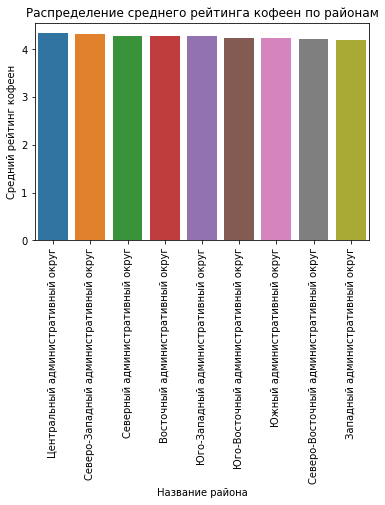

In [47]:
sns.barplot(x='district', y='rating', data=coffee_houses_rating)

plt.title('Распределение среднего рейтинга кофеен по районам')
plt.xlabel('Название района')
plt.ylabel('Средний рейтинг кофеен')
plt.xticks(rotation=90)

plt.show()

In [48]:
# На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
coffee_houses_cofcup = coffee_houses.groupby('district', as_index=False)\
.agg({'middle_coffee_cup': 'mean'}).round(2)\
.sort_values(by='middle_coffee_cup', ascending=False).reset_index()
coffee_houses_cofcup

,index,district,middle_coffee_cup
0,1,Западный административный округ,189.94
1,5,Центральный административный округ,187.52
2,7,Юго-Западный административный округ,184.18
3,0,Восточный административный округ,174.02
4,2,Северный административный округ,165.79
5,4,Северо-Западный административный округ,165.52
6,3,Северо-Восточный административный округ,165.33
7,8,Южный административный округ,158.49
8,6,Юго-Восточный административный округ,151.09


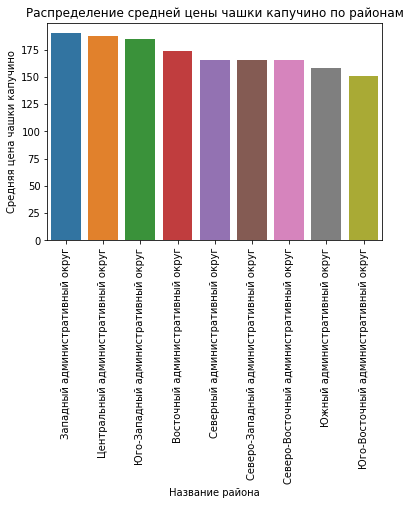

In [49]:
sns.barplot(x='district', y='middle_coffee_cup', data=coffee_houses_cofcup)

plt.title('Распределение средней цены чашки капучино по районам')
plt.xlabel('Название района')
plt.ylabel('Средняя цена чашки капучино')
plt.xticks(rotation=90)

plt.show()

In [50]:
# Вычислим среднюю стоимость чашки капучино по всем районам
coffee_houses_cofcup['middle_coffee_cup'].mean().round(2)

171.32

При открытии кофейни стоит ориентироваться на стоимость чашки капучино в 171 либо выбирать из диапазона 151-190 в зависимости от района. 171 -- это средняя цена чашки капучино по всем районам, а 151-190 -- это диапазон, по которому распределена цена чашки капучино кофеен из разных районов.

Рекомендации для открытия нового заведения:
- в Москве имеется 1413 кофеен, что составляет 16,8%(1413/8406*100) от общего числа заведений общественного питания; это достаточно большой процент, поэтому конкуренция на рынке кофеен будет высокой; возможно, стоит подумать, есть ли смысл открывать кофейню в Москве
- в результате исследования выяснено, что больше всего кофеен в центральном и северном административных округах, особенно в центральном; меньше же всего кофеен в юго-западном, юго-восточном и северо-западном административных округах, поэтому для открытия кофейни стоит обратить внимание на эти округа
- количество круглосуточных кофеен составляет 59, что составляет 4,18%(59/1413*100) от общего числа кофеен; возможно, открывать круглосуточное заведение не стоит
- при открытии кофейни стоит ориентироваться на стоимость чашки капучино в 171

# Шаг 5. Подготовка презентации

Презентация: https://drive.google.com/file/d/1i75p-RWa37Mow3kTjchXmV38VEn5GqOJ/view?usp=sharing